In [1]:
# import the necessary packages
from skimage.segmentation import clear_border
import commonfunctions as cf
import math
import os
import numpy as np
import imutils
import cv2
from skimage.measure import find_contours
from skimage.draw import rectangle
from skimage.morphology import binary_erosion, binary_dilation
from skimage.feature import canny
from skimage.filters import threshold_otsu, sobel
from skimage.transform import rotate
from skimage.transform import (hough_line, hough_line_peaks)
from scipy.stats import mode
from joblib import load
global plate_number
plate_number=[]

In [ ]:
def plate_detection_morphological_operations(thresh):
  thresh = cv2.erode(thresh, None, iterations=3)
  thresh = cv2.dilate(thresh, None, iterations=8)
  thresh = cv2.erode(thresh, None, iterations=1)
  thresh = cv2.dilate(thresh, None, iterations=7)
  thresh = cv2.erode(thresh, None, iterations=1)
  return thresh

In [ ]:
def post_processing_morphological_operations(thresh, rectKern):
  thresh = cv2.dilate(thresh, rectKern, iterations=8)
  thresh = cv2.dilate(thresh, None, iterations=8)
  thresh = cv2.erode(thresh, None, iterations=2)
  return thresh

In [3]:
def skew_angle_hough_transform(image):
    # convert to edges
    edges = canny(image)
    # Classic straight-line Hough transform between 0.1 - 180 degrees.
    h, theta, d = hough_line(edges)
    # find line peaks and angles
    accum, angles, dists = hough_line_peaks(h, theta, d)
    # print(angles)
    # round the angles to 2 decimal places and find the most common angle.
    most_common_angle = mode(np.around(angles, decimals=2))[0]
    # print(most_common_angle)
    # convert the angle to degree for rotation.
    skew_angle = np.rad2deg(most_common_angle)
    if skew_angle<0:
      skew_angle=skew_angle+90
    else:
      skew_angle=skew_angle-90
    
    return skew_angle

def skewRotation(plate):
  plateEdges=canny(plate)
  angle=skew_angle_hough_transform(plate)
  if len(angle) == 0:
    angle = 0
  else:
    angle=angle[0]
  rotated_image=rotate(plate, angle)
  return rotated_image
    

In [4]:
def plate_detection(car_img, post_processing=False):
    # 1- Resize image
    if not post_processing:
        car_img = cv2.resize(car_img, (800, 600))
    # 2- Convert to gray
    gray = cv2.cvtColor(car_img, cv2.COLOR_BGR2GRAY)
    rectKern = cv2.getStructuringElement(cv2.MORPH_RECT, (13, 5))
    
    # 3- Perform a blackhat morphological operation 
    # It will allow us to reveal dark regions (i.e., text) on light backgrounds (i.e., the license plate itself)
    # black-hat transform =  closing - input image
    blackhat = cv2.morphologyEx(gray, cv2.MORPH_BLACKHAT, rectKern)
    # 4- Applying closing using square structuring element
    # To find regions in the image that are light and may contain license plate characters:
    squareStrucElement = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    light = cv2.morphologyEx(gray, cv2.MORPH_CLOSE, rectKern)
    # 5- binary thresholding, if pixel intensity is greater than threshold set it to 255, else set it to 0
    light = cv2.threshold(light, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
    # 6- compute the Sobel gradient representation of the blackhat
    # image in the x-direction and then scale the result back to the range [0, 255]
    gradX = cv2.Sobel(blackhat, ddepth=cv2.CV_32F, dx=1, dy=0, ksize=-1)
    gradX = np.absolute(gradX)
    (minVal, maxVal) = (np.min(gradX), np.max(gradX))
    gradX = 255 * ((gradX - minVal) / (maxVal - minVal))
    gradX = gradX.astype("uint8")
    # show the gradient image
    # cf.show_images([gradX], ["gradX"])
    
    # 7- blur the gradient representation, applying a closing operation, and threshold the image using Otsu's method
    gradX = cv2.GaussianBlur(gradX, (5, 5), 0)
    gradX = cv2.morphologyEx(gradX, cv2.MORPH_CLOSE, rectKern)

    thresh = cv2.threshold(gradX, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
    # 8- perform a series of erosions and dilations to clean up the thresholded image
    if not post_processing:
        result_img = plate_detection_morphological_operations(thresh)
    else:
        result_img = post_processing_morphological_operations(thresh, rectKern)
        
    # 9- take the bitwise AND between the threshold result and the light regions of the image
    result_img = cv2.bitwise_and(result_img, result_img, mask=light)

    if not post_processing:
        result_img = cv2.dilate(result_img, None, iterations=8)
        result_img = cv2.erode(result_img, None, iterations=1)
    
    # 10- find contours in the thresholded image 
    # sort them by their size in descending order, keeping only the largest ones
    cnts = cv2.findContours(result_img.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    cnts = sorted(cnts, key=cv2.contourArea, reverse=True)[:30]
    
    # initialize the license plate contour
    licensePlate=None
    # These are the car contours below
    # 11-loop over the license plate candidate contours
    for c in cnts:
        (x,y,w,h)=cv2.boundingRect(c)
        lpCnt = c
        # If it was post processing compute some checks
        if post_processing:
            if( w>60):            
                licensePlate = gray[y:y + h, x:x + w]
                rotated_plate=skewRotation(licensePlate)
                break
        else:
            # If it was plate detection compute some checks
            if w>300 or h>140:
                continue
            if(w>1.3*h and w < 3.5*h):
                licensePlate = gray[y:y + h, x:x + w]
                break
    return licensePlate
    

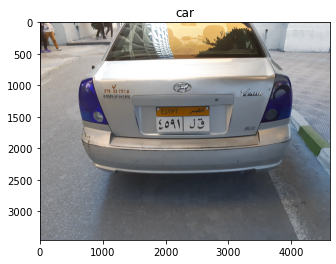

C:\Users\karim\AppData\Local\Temp\ipykernel_37100\748713636.py:14: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if skew_angle<0:


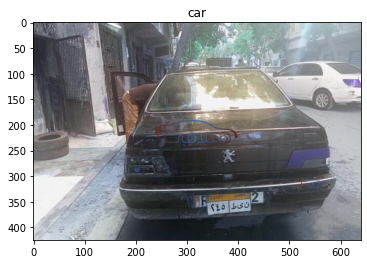

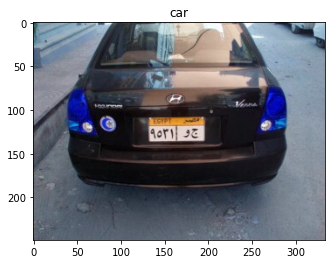

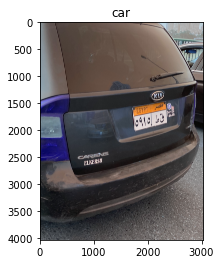

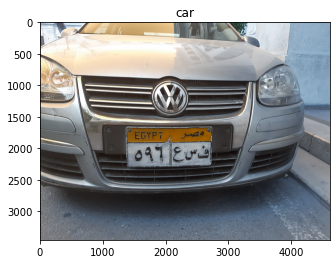

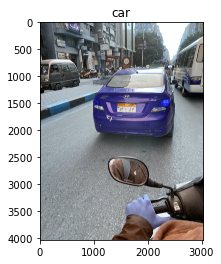

...

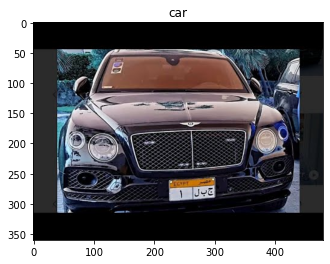

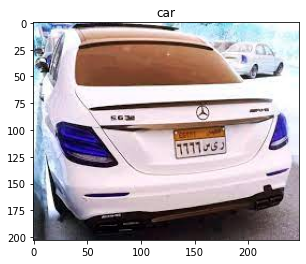

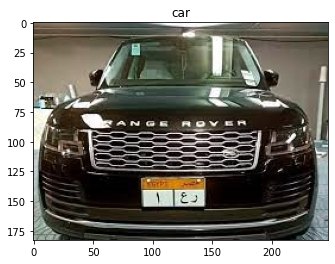

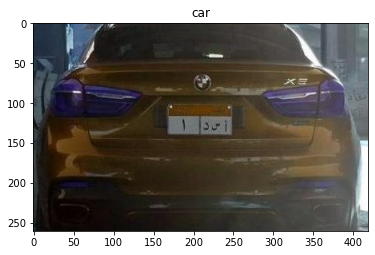

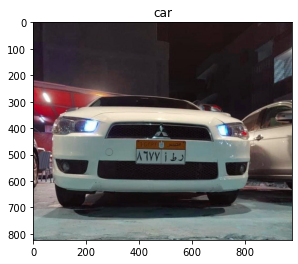

In [5]:
import glob
import os
# files = glob.glob('outputPlateRecog/*')
# for f in files:
#   os.remove(f)
files = glob.glob('outputPlateDetection/*')
for f in files:
  os.remove(f)
for imgName in sorted(glob.glob('AllWorking/*.jpg')):
  car = cv2.imread(imgName)
  cf.show_images([car], ["car"])
  # print(imgName)
  to_be_modified_plate=plate_detection(car)
  if to_be_modified_plate is None:
    continue
  # show
  # cf.show_images([to_be_modified_plate], ["to_be_modified_plate"])
  to_be_modified_plate = cv2.cvtColor(to_be_modified_plate, cv2.COLOR_GRAY2BGR)
  last_plate_processed=plate_detection(to_be_modified_plate, True)
  if last_plate_processed is None:
    continue
  # cf.show_images([last_plate_processed], ["last_plate_processed"])
  imgName = "outputPlateDetection/"+imgName.split('\\')[1]
  check = cv2.imwrite(imgName, last_plate_processed)
  cv2.imwrite('outputPlateDetection/'+imgName, last_plate_processed)

  # imgName = "outputPlateRecog/"+imgName.split('\\')[1]
  # check = cv2.imwrite(imgName, to_be_modified_plate)
  # cv2.imwrite('outputPlateRecog/'+imgName, to_be_modified_plate)

# for imgName in sorted(glob.glob('outputPlateRecog/*.jpg')):
#   plate = cv2.imread(imgName)
#   print(imgName)
#   last_plate_processed=plate_detection(plate, True)
#   cf.show_images([last_plate_processed], ["last_plate_processed"])
#   imgName = "outputPlateDetection/"+imgName.split('\\')[1]
#   check = cv2.imwrite(imgName, last_plate_processed)
#   cv2.imwrite('outputPlateDetection/'+imgName, last_plate_processed)
  

In [6]:
import numpy as np
import skimage.io as io
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
from skimage.morphology import binary_erosion, binary_dilation, binary_closing,skeletonize, thin
from skimage.measure import find_contours
from skimage.draw import rectangle
import cv2
import os
from joblib import load

PADDING=3
PLATE_WIDTH=1200  
MIN_CHAR_RATIO=0.2
MAX_CHAR_RATIO=1.3 
CHARACTER_DIM=(30,30)
CLASS_ARA= {
    '0': '٠', '1': '١', '2': '٢', '3': '٣', '4': '٤', '5': '٥', '6': '٦', '7': '٧', '8': '٨', '9': '٩',
    'alf':'أ','beh':'ب','dal':'د','fa2':'ف','gem':'ج','hah':'ح','heh':'ه','kaf':'ق','kha':'خ','lam':'ل','mem':'م','non':'ن','ra2':'ر','sad':'ص','sen':'س','ta2':'ط','wow':'و','ya2':'ى',
    '3en':'ع'
}    



# Show the matlpotlib figures inside the notebook
%matplotlib inline
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

In [7]:
alphanumeric = ['أ', 'ب', 'ع', 'ف', 'ج', 'ه', 'ق', 'ل', 'م', 'ن', 'ر', 'ص', 'س', 'ط', 'و', 'ي', 'د', '٩', '٨', '٧', '٦', '٥', '٤', '٣', '٢', '١']


In [25]:
def preProcessPlate(img):
    
    

    blur = cv2.GaussianBlur(img, (3,3), 0)

    # Performing OTSU threshold
    ret, thresh1 = cv2.threshold(blur, 0, 255, cv2.THRESH_OTSU | cv2.THRESH_BINARY_INV)

    # Specify structure shape and kernel size.
    # Kernel size increases or decreases the area
    # of the rectangle to be detected.
    # A smaller value like (10, 10) will detect
    # each word instead of a sentence.
    rect_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (15, 60))

    # Applying dilation on the threshold image
    dilation = cv2.dilate(thresh1, rect_kernel, iterations = 1)    
    return dilation

In [9]:
def resizePlate(img):
    """
        resize plate to constant width
    """
    factor=PLATE_WIDTH/img.shape[0]
    width=int(img.shape[0]*factor)
    height=int(img.shape[1]*factor)

    dim = ( height ,width  )
    return cv2.resize(img,dim, interpolation = cv2.INTER_AREA)

In [10]:
def crop_image(image):
    Base_Image=image
    # loop from top left corner until a white pixel is found and save its row
    for i in range(0,Base_Image.shape[0]):
        for j in range(0,Base_Image.shape[1]):
            if Base_Image[i,j]==255:
                break
        if Base_Image[i,j]==255:
            break
    # print the row number
    top_row=i

    # loop from bottom left corner until a white pixel is found and save its row
    for i in range(Base_Image.shape[0]-1,0,-1):
        for j in range(0,Base_Image.shape[1]):
            if Base_Image[i,j]==255:
                break
        if Base_Image[i,j]==255:
            break
    # print the row number
    bottom_row=i

    segment_1=Base_Image[top_row:bottom_row,:]
    return segment_1


In [26]:
def character_enhansement():
    import os
    path, dirs, files = next(os.walk("outputCharacters"))
    file_count = len(files)
    # load all images in folder output using loop from 0 to file_count
    for i in range(0,file_count):
        img= cv2.imread('outputCharacters/'+str(i)+'.jpg')
        # show original image
        # cf.show_images([img],['Original image'])
        print(img.shape)
        # improve image resolution
        img = cv2.resize(img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        # show improved image
        # show_images([img],['Improved image'])

        # threshold the image
        ret,thresh = cv2.threshold(img,127,255,cv2.THRESH_BINARY)
        # convert to binary image
        binary_image = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)[1]
        # negative transformation of binary image
        negative_image= cv2.bitwise_not(binary_image)
        # apply closing to negative image
        kernel = np.ones((3,3),np.uint8)
        negative_image = cv2.morphologyEx(negative_image, cv2.MORPH_CLOSE, kernel)
        # show resized negative image
        # show_images([negative_image],['Resized negative image'])
        cropped_image=crop_image(negative_image)
        # resize negative image to 40x50
        try:
            negative_image= cv2.resize(cropped_image,(40,50))

        except Exception as e:
            print(str(e))
        # show resized negative image
        if cropped_image.shape[0]>0:
            cv2.imwrite('outputCharacters/'+str(i)+'.jpg',negative_image)

In [12]:
def character_printing(str):
    # print("str = ",str)
    res=int(str)
    # print("res = ",res)
    alphanumeric = ['أ', 'ب', 'ع', 'ف', 'ج', 'ه', 'ق', 'ل', 'م', 'ن', 'ر', 'ص', 'س', 'ط', 'و', 'ي', 'د']
    # print("len(alphanumeric) = ",len(alphanumeric))
    if res > len(alphanumeric):
        return
    result = alphanumeric[res]
  
    plate_number.append(result)
    return result


In [13]:
def number_printing(str):
    # print("str = ",str)
    res=int(str)
    numbers_arr=['1','2','3','4','5','6','7','8','9']
    # print("res = ",res)
    # numbers_arr = ['٩', '٨', '٧', '٦', '٥', '٤', '٣', '٢', '١']
    # print("len(alphanumeric) = ",len(alphanumeric))
    result = numbers_arr[res]
  
    plate_number.append(result)
    return result

In [14]:
def match_result(image1, image2):
   # h= image1.shape[0]
   # w=image1.shape[1]
   # diff = cv2.subtract(image1, image2)
   # err = np.sum(diff**2)
   # mse = err/(float(h*w))
   # return mse
   mse = cv2.matchTemplate(image1,image2,cv2.TM_CCOEFF_NORMED)
   return mse

In [15]:
def character_matching():
    import glob
    import os
    path, dirs, files = next(os.walk("outputCharacters"))
    file_count = len(files)
    # load all images in folder output using loop from 0 to file_count
    for i in range(0,file_count):
        arr=[]
        img= cv2.imread('outputCharacters/'+str(i)+'.jpg')
        for i in range(0,17):
            img2= cv2.imread(('7roof2/'+str(i)+'.jpg'))
            res=match_result(img,img2)
            arr.append(res)
            i+=1
        max=np.argmax(arr)  
        # 7ot el function bta3t el if 
        # print(max) 
        max=str(max)
        character_printing(max)


In [27]:
def number_enhansement():
    import os
    path, dirs, files = next(os.walk("outputNumbers"))
    file_count = len(files)
    # load all images in folder outputNumbers using loop from 0 to file_count
    for i in range(0,file_count):
        img= cv2.imread('outputNumbers/'+str(i)+'.jpg')
        # show original image
        # cf.show_images([img],['Original image'])
        # improve image resolution
        img = cv2.resize(img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        # show improved image
        # show_images([img],['Improved image'])

        # threshold the image
        ret,thresh = cv2.threshold(img,127,255,cv2.THRESH_BINARY)
        # convert to binary image
        binary_image = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)[1]
        # negative transformation of binary image
        negative_image= cv2.bitwise_not(binary_image)
        # apply closing to negative image
        kernel = np.ones((3,3),np.uint8)
        negative_image = cv2.morphologyEx(negative_image, cv2.MORPH_CLOSE, kernel)
        # show resized negative image
        # show_images([negative_image],['Resized negative image'])
        cropped_image=crop_image(negative_image)
         # resize negative image to 25x50
        try:
            negative_image= cv2.resize(cropped_image,(25,50))
        except Exception as e:
            print(str(e))
        # save resized negative image
        if cropped_image.shape[0]>0:
         cv2.imwrite('outputNumbers/'+str(i)+'.jpg',negative_image)

In [17]:
def number_matching():
    import glob
    import os
    path, dirs, files = next(os.walk("outputNumbers"))
    file_count = len(files)
    # load all images in folder outputNumbers using loop from 0 to file_count
    for i in range(0,file_count):
        arr_num=[]
        img= cv2.imread('outputNumbers/'+str(i)+'.jpg')
        for i in range(0,9):
            img2= cv2.imread(('Arkam1/'+str(i)+'.jpg'))
            res_num=match_result(img,img2)
            arr_num.append(res_num)
            i+=1
        max=np.argmax(arr_num)  
        # convert max to string
        max=str(max)
        number_printing(max)


In [18]:
#load the trained model if exists else train
if not os.path.isfile('model.joblib'):
    print("ERROR : NO MODEL IMPORTED")
    quit()    
else:
    model = load('model.joblib')


In [19]:
def segmentPlate2(image,cropFrom):
    
    # Note
    # --------
    # img is the image after preprocessing 
    # cropFrom the image to take characters from
    
    # Finding contours
    contours, hierarchy = cv2.findContours(image, cv2.RETR_TREE,
                                                    cv2.CHAIN_APPROX_NONE)
    
    contours = sorted(contours, key=lambda tup: cv2.boundingRect(tup)[0])
    chars=[]
    X_s=[]
    
    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)
        if not( x > PADDING and y > PADDING):
            continue

        x-=PADDING
        y-=PADDING
        w+=2*PADDING
        h+=2*PADDING

        if(w/h> MIN_CHAR_RATIO and w/h < MAX_CHAR_RATIO): 
            cropped = cropFrom[y:y + h, x:x + w]
            if cropped.shape[0]>0 and cropped.shape[1]>0:                
                chars.append(cropped)
                X_s.append(x+(w/2))
            
    chars2=[]
    X_s2=[]
   

    for i in range(len(chars)):
        if chars[i].shape[1] > 105:
                chars2.append(chars[i])
                X_s2.append(X_s[i])
        
    
    # get position of contour in cropFrom
    counter=0
    # save all images in chars array in folder outputNumbers and outputCharacters
    for i in range(len(chars2)):
        if  X_s2[i] < cropFrom.shape[1]/2:
            cv2.imwrite('outputNumbers/'+str(i)+'.jpg', chars2[i])
        else:

            cv2.imwrite('outputCharacters/'+str(counter)+'.jpg', chars2[i])
            counter+=1      
    return chars2
    


In [20]:
def recognizeChar(img):
    image = cv2.resize(img,CHARACTER_DIM)/255
    # cf.show_images([image],['Resized image'])
    imgFeatures=[image.flatten()]
    model_classes = model.classes_
    predicted = model.predict(imgFeatures)
    score = model.predict_proba(imgFeatures)

    index = np.where(model_classes == predicted[0])[0][0]
    predicted = predicted[0]
    score = score[0][index]
    return predicted,score

In [21]:
def mapClassToChar(charClass):
    return CLASS_ARA[charClass]

In [32]:
def readPlate2(image):
   Gray_image=resizePlate(image)
#    cf.show_images([Gray_image],['Resized_whole_image'])
   preprocessed = preProcessPlate(Gray_image)
#    cf.show_images([preprocessed],['preprocessed_whole_image'])
   segments=segmentPlate2(preprocessed,Gray_image)
   kernel = np.ones((4,7),np.uint8)
   # --------------------------------------------------------------------------------

       # convert each segment to binary image
   for i in range(len(segments)):
         segments[i] = cv2.threshold(segments[i], 0, 255, 
               cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
      #    # apply closing to each segment
         segments[i] = cv2.morphologyEx(segments[i], cv2.MORPH_CLOSE, kernel)
      # apply cropping to each segment using crop_image function
         segments[i] = crop_image(segments[i])
   
   
               
   # show the segmented characters
   # cf.show_images(segments)

   text=""
   for segment in segments:
        char,score=recognizeChar(segment)
        if score>0.52:
            text+=mapClassToChar(char)+' '
      #   else: 
         #  print ("score is less than 0.52")
         #  print (score)
   if text!="":
        cf.show_images([Gray_image])
   return text[::-1]  # reverse String

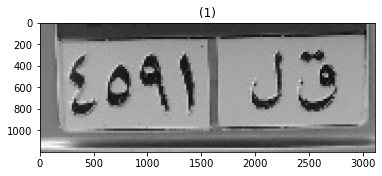

Plate Number :   ق ل ١ ٩ ٥ ٤


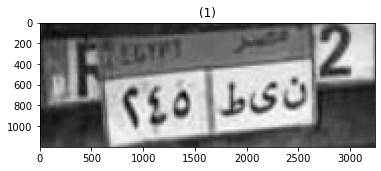

Plate Number :   ى ط ٥ ٤ ٢ ن


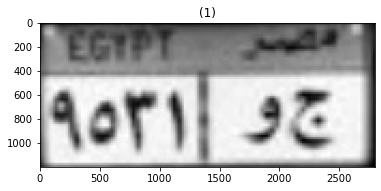

Plate Number :   ج و ١ ٣ ٥ ٩


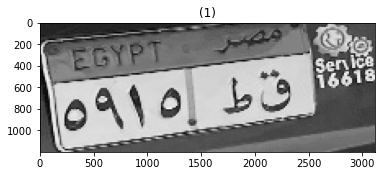

Plate Number :   ط ٥ ١ ٩ ٥


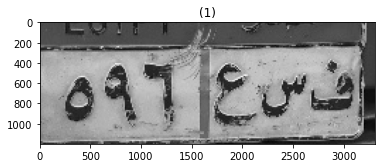

Plate Number :   ف س ع ٩ ٥


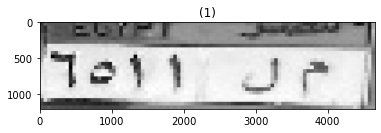

Plate Number :   م ل ١ ١ ٥ ٦


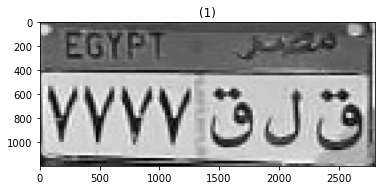

Plate Number :   ق ل ق ٧ ٧ ٧ ٧


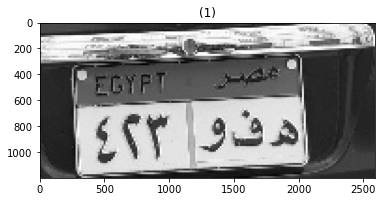

Plate Number :   ه ف و ٣ ٢ ٤


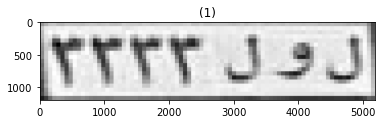

Plate Number :   ل و ل ٣ ٣ ٣ ٣


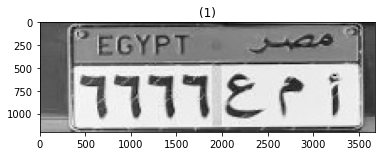

Plate Number :   أ م ع ٦ ٦ ٦ ٦


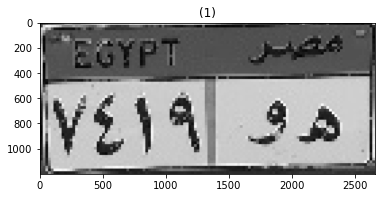

Plate Number :   ه و ٩ ١ ٤ ٧


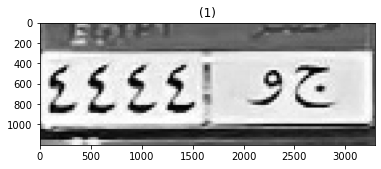

Plate Number :   ج و ٤ ٤ ٤ ٤


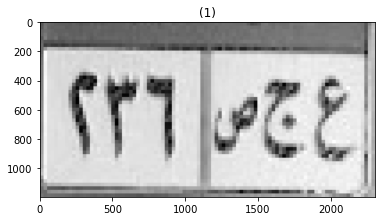

Plate Number :   ع ج ص ٦ ٣ ٢


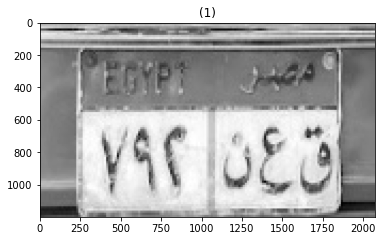

Plate Number :   ق ع ن ٢ ٩ ٧


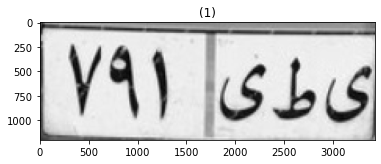

Plate Number :   ى ط ى ١ ٩ ٧


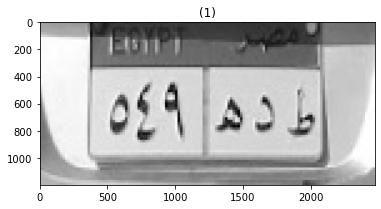

Plate Number :   ط د ه ٩ ٤ ٥ ٥


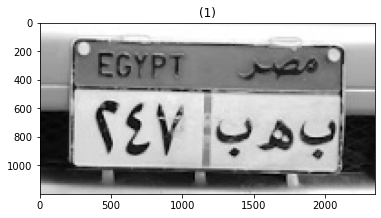

Plate Number :   ه ب ٧ ٤ ٢


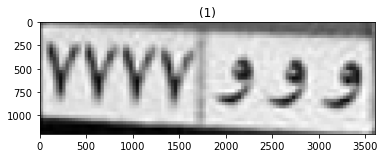

Plate Number :   و و و ٧ ٧ ٧ ٧


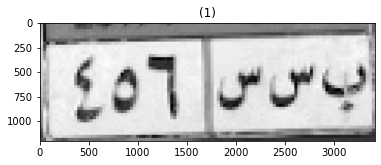

Plate Number :   ب س س ٦ ٥ ٤


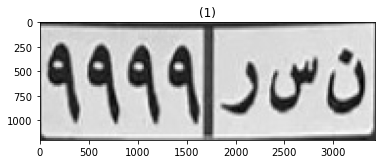

Plate Number :   ن س ر ٩ ٩ ٩ ٩


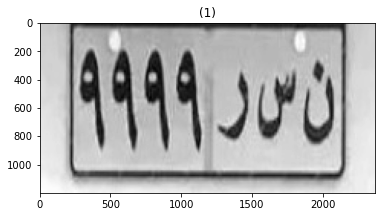

Plate Number :   ن س ر ٩ ٩ ٩ ٩


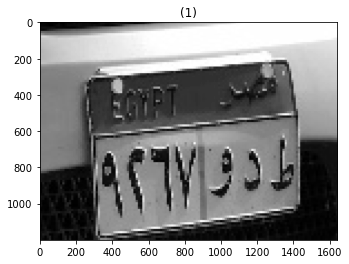

Plate Number :   د و ٣ ٦ ٢ ٩


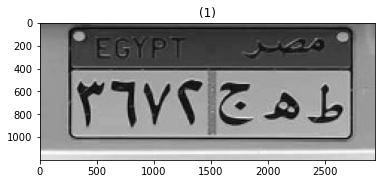

Plate Number :   ط ه ٥ ج ٢ ٧ ٦ ٣


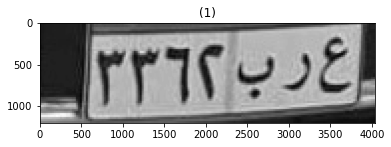

Plate Number :   ع ر ب ٢ ٦ ٣ ٣


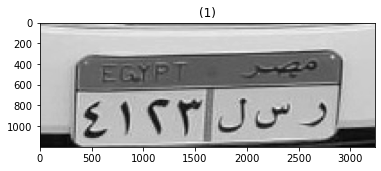

Plate Number :   ر س ل ٣ ٢ ١ ٤


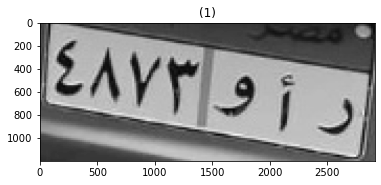

Plate Number :   أ و ٣ ٧ ٨ ٤


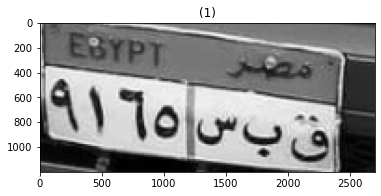

Plate Number :   ب س ٥ ٦ ١ ٩


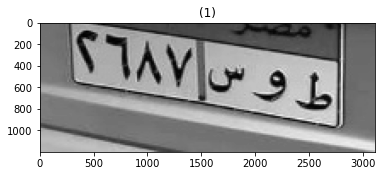

Plate Number :   ط و س ٧ ٨ ٦


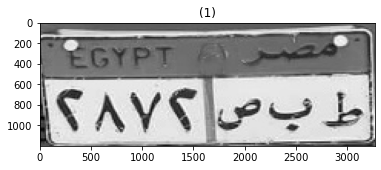

Plate Number :   ط ب ص ٢ ٧ ٨ ٢


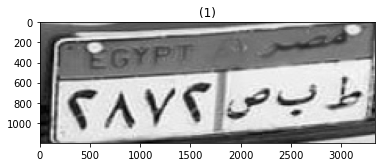

Plate Number :   ط ب ص ٢ ٧ ٨ ٢


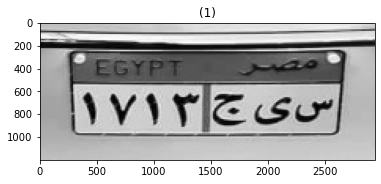

Plate Number :   س ى ج ٣ ١ ٧ ١


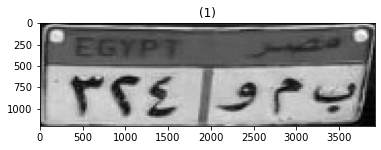

Plate Number :   ب م و ٤ ٢ ٣


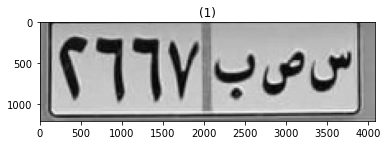

Plate Number :   س ص ن ٧ ٦ ٦ ٢


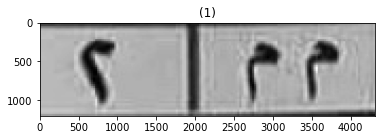

Plate Number :   م م ٢


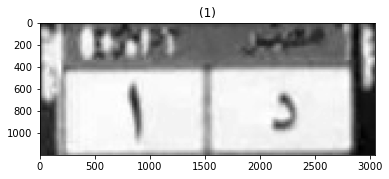

Plate Number :   د ١


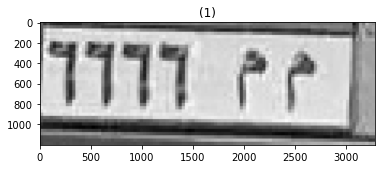

Plate Number :   م م ٦ ٦ ٦ ٦


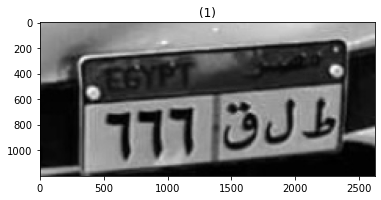

Plate Number :   ط ل ق ٦ ٦ ٦


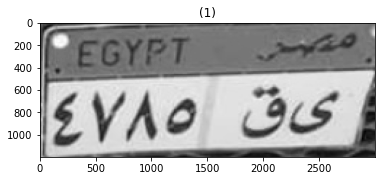

Plate Number :   ى ق ٥ ٨ ٧ ٤


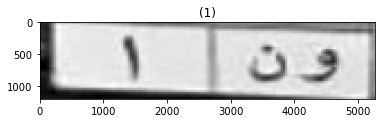

Plate Number :   و ب ١


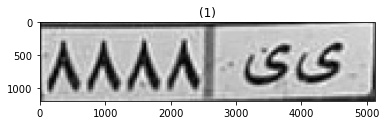

Plate Number :   ى ى ٨ ٨ ٨ ٨


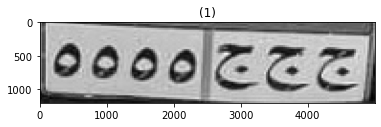

Plate Number :   ج ج ج ٥ ٥ ٥ ٥


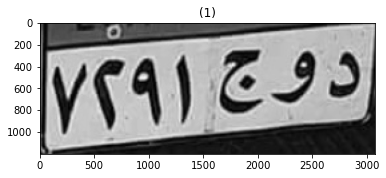

Plate Number :   د و ٥ ج ١ ٩ ٢ ٧


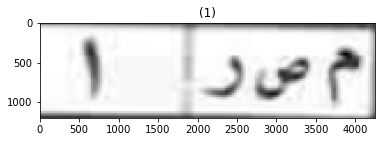

Plate Number :   م ص ر ١


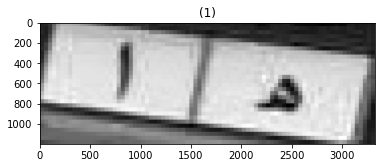

Plate Number :   ه ١


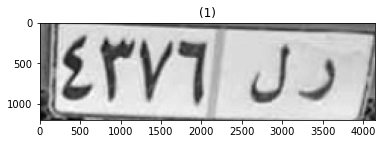

Plate Number :   ر ل ٦ ٧ ٣ ٤


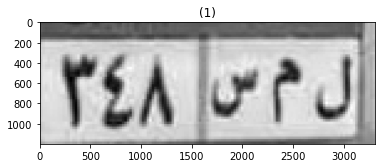

Plate Number :   ل م س ٨ ٤ ٣


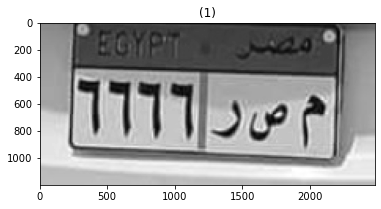

Plate Number :   م ص ر ٦ ٦ ٦ ٦


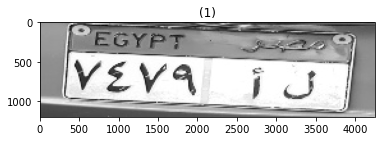

Plate Number :   ل أ ٩ ٧ ٤ ٧


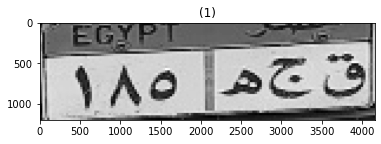

Plate Number :   ق ٥ ج ٥ ٨ ١


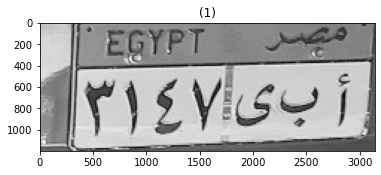

Plate Number :   أ ب ى ٧ ٤ ١ ٣


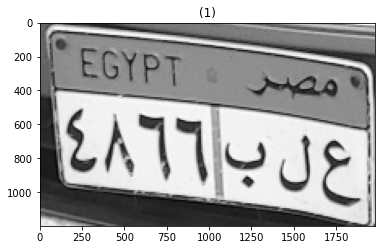

Plate Number :   ع ل ب ٦ ٦ ٨ ٤


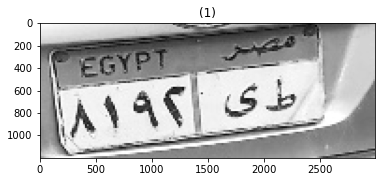

Plate Number :   ط ى ٢ ٩ ١ ٨


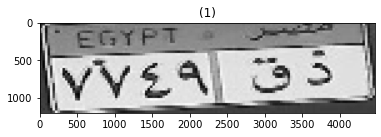

Plate Number :   د ق ٩ ٤ ٧ ٧


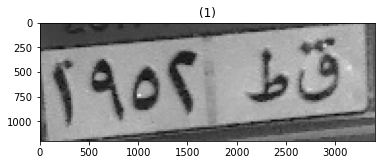

Plate Number :   ق ط ٢ ٥ ٩ ١


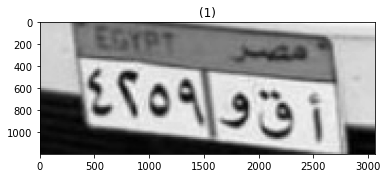

Plate Number :   ١ ١ ق و ٩ ٥ ٢ ٤


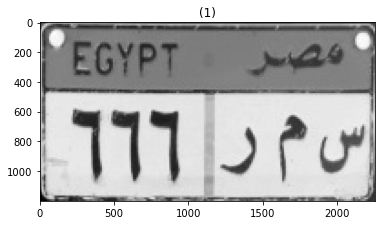

Plate Number :   س م ر ٦ ٦ ٦


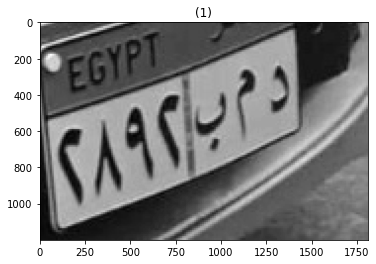

Plate Number :   د م ب ٢ ٩ ٨ ٢


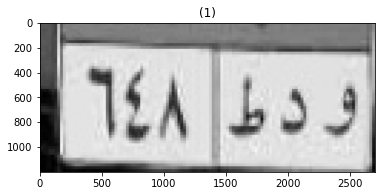

Plate Number :   و ٥ ط ٨ ٤ ٦


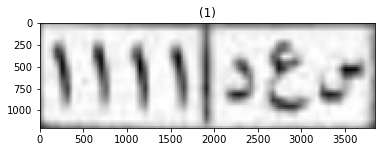

Plate Number :   س ع د ١ ١ ١ ١


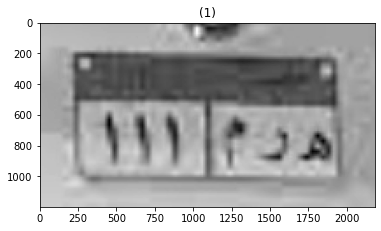

Plate Number :   ه ر م ١ ١


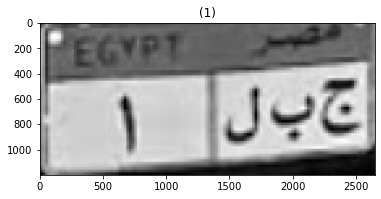

Plate Number :   ج ب ل ١


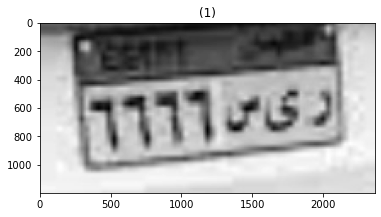

Plate Number :   ى س ٦ ٦ ٦ ٦


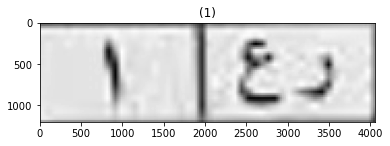

Plate Number :   ر ع ١


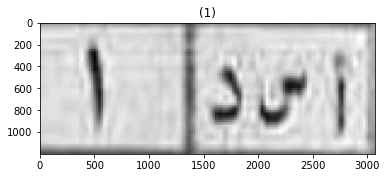

Plate Number :   س د ١


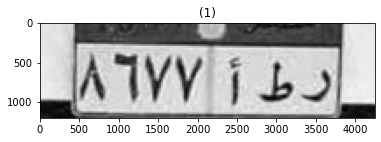

Plate Number :   ر ط أ ٧ ٧ ٦ ٨


In [31]:
import glob
i=0
for imgName in sorted(glob.glob('outputPlateDetection/*.jpg')):

    plateImage=cv2.imread(imgName)
    plateImage=cv2.cvtColor(plateImage,cv2.COLOR_BGR2GRAY)
    
    txt =readPlate2(plateImage)
    if txt !="":
        print("Plate Number :  " + txt)
    
